# Playgrounds
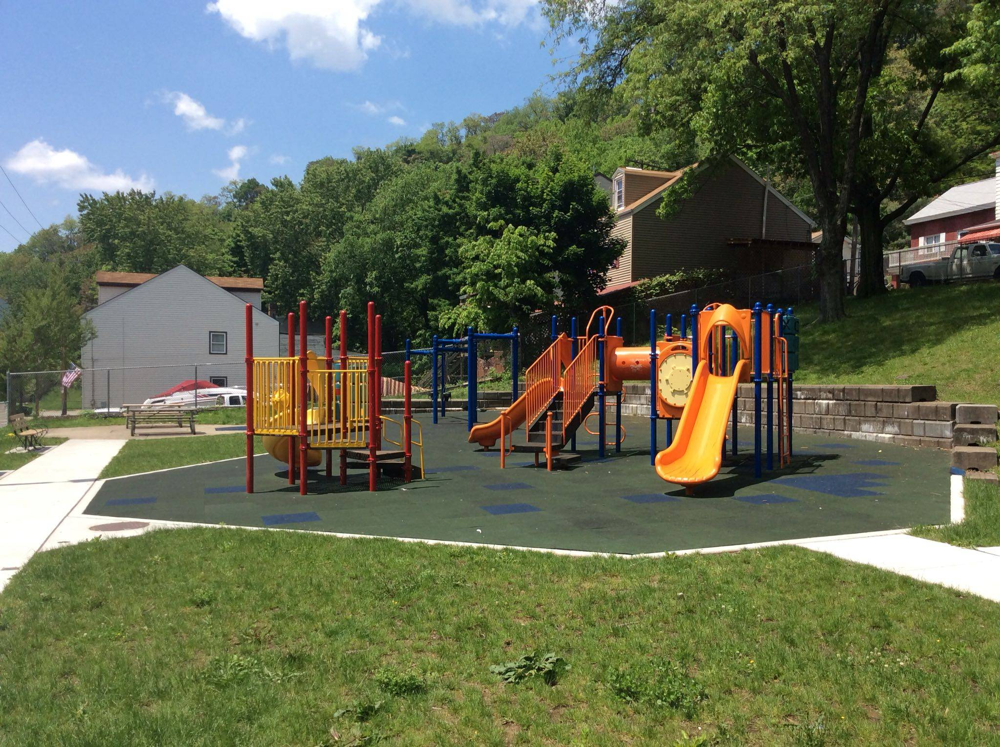
Something fun for a neiborhood to have is a Playground. I remember when I was a kid going out with my siblings and playing at my local playground. We all remember recess, playing at the school playground. Playgrounds are fun, so the lack of them must be boring. 

In [1]:
import pandas as pd
import geopandas
%matplotlib inline
import matplotlib.pyplot as plt

In [40]:
playgrounds = pd.read_csv("playgrounds.csv")
playgrounds.head(10)

,_id,id,name,type,maintenance_responsibility,park,street,image,neighborhood,council_district,ward,tract,public_works_division,pli_division,police_zone,fire_zone,latitude,longitude
0,1,731501774,Able Long Playground,NaN,Parks - Western,Able Long Park,COAST AVE,https://tools.wprdc.org/images/pittsburgh/play...,Beechview,4,19,42003192000,5,19,6,4-28,40.408365,-80.028445
1,2,1461276747,Albert Graham Playground,NaN,Parks - Schenley,Albert Turk Graham Park,FORESIDE PL,https://tools.wprdc.org/images/pittsburgh/play...,Crawford-Roberts,6,3,42003030500,3,3,2,2-1,40.440519,-79.984137
2,3,1860709784,Alpine Playground,NaN,Parks - Northern,Alpine Gardens Park,ALPINE AVE,https://tools.wprdc.org/images/pittsburgh/play...,Central Northside,6,25,42003250300,1,25,1,1-21,40.457707,-80.012952
3,4,1770671485,Alton Playground,NaN,Parks - Western,Alton Park,ANDICK WAY,https://tools.wprdc.org/images/pittsburgh/play...,Beechview,4,19,42003191600,5,19,6,4-28,40.414137,-80.021605
4,5,18942817,Ammon Playground,NaN,Parks - Schenley,Ammon Park,MEMORY LN,https://tools.wprdc.org/images/pittsburgh/play...,Bedford Dwellings,6,5,42003050900,3,5,2,2-5,40.449037,-79.978064
5,6,230731204,Arlington Playground,NaN,Parks - Southern,Arlington Park,FERNLEAF ST,https://tools.wprdc.org/images/pittsburgh/play...,South Side Slopes,3,16,42003160800,3,16,3,4-22,40.418094,-79.975429
6,7,420573029,Armstrong Playground,NaN,Parks - Southern,Armstrong Park,S 12TH ST,https://tools.wprdc.org/images/pittsburgh/play...,South Side Flats,3,17,42003170200,3,17,3,4-24,40.428165,-79.986121
7,8,113170092,Arsenal Playground,NaN,Parks - Northeast,Arsenal Park,40TH ST,https://tools.wprdc.org/images/pittsburgh/play...,Lower Lawrenceville,7,6,42003060300,2,6,2,3-3,40.466721,-79.961520
8,9,2089697067,August WIlson Playground,NaN,Parks - Schenley,August Wilson Park,CLIFF ST,https://tools.wprdc.org/images/pittsburgh/play...,Crawford-Roberts,6,3,42003030500,3,3,2,2-1,40.446510,-79.985968
9,10,2124405123,Banksville Playground,NaN,Parks - Western,Banksville Park,CRANE AVE,https://tools.wprdc.org/images/pittsburgh/play...,Banksville,2,20,42003202300,5,20,6,4-9,40.414666,-80.039342


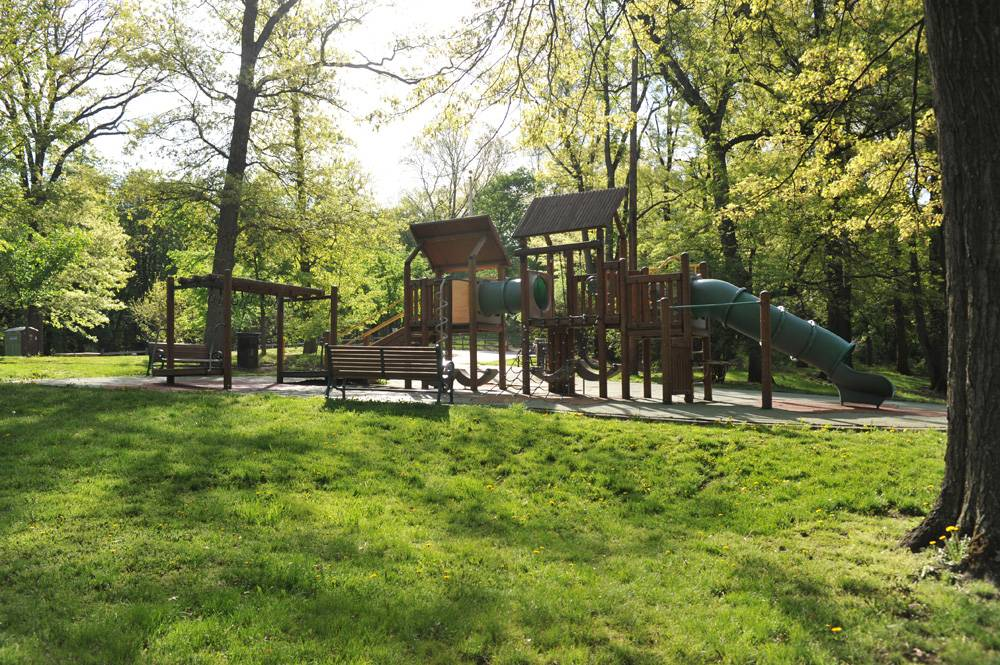

Using a data set from 2021 that noting all playgrounds at that time, I am able to count how many Playgrounds are in each neighborhood. Since not all nieborhoods have 

In [62]:
counts = playgrounds["neighborhood"].value_counts()
counts.head()
len(playgrounds["neighborhood"].unique())
neighborhoods = geopandas.read_file("Neighborhoods/Neighborhoods_.shp") 
count_map = neighborhoods.merge(counts,  how='left', left_on='hood', right_on='neighborhood')
count_map.fillna({"count":0}, inplace=True)

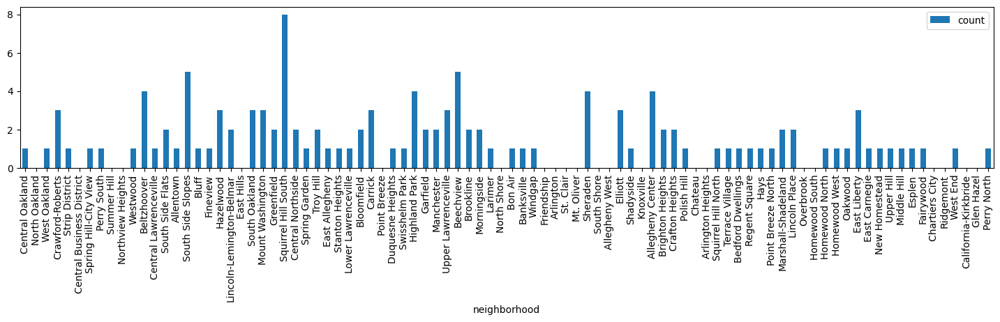

In [74]:
count_map.plot(x='hood', y ='count', kind='bar', figsize= (18,3), xlabel = "neighborhood")
plt.show()

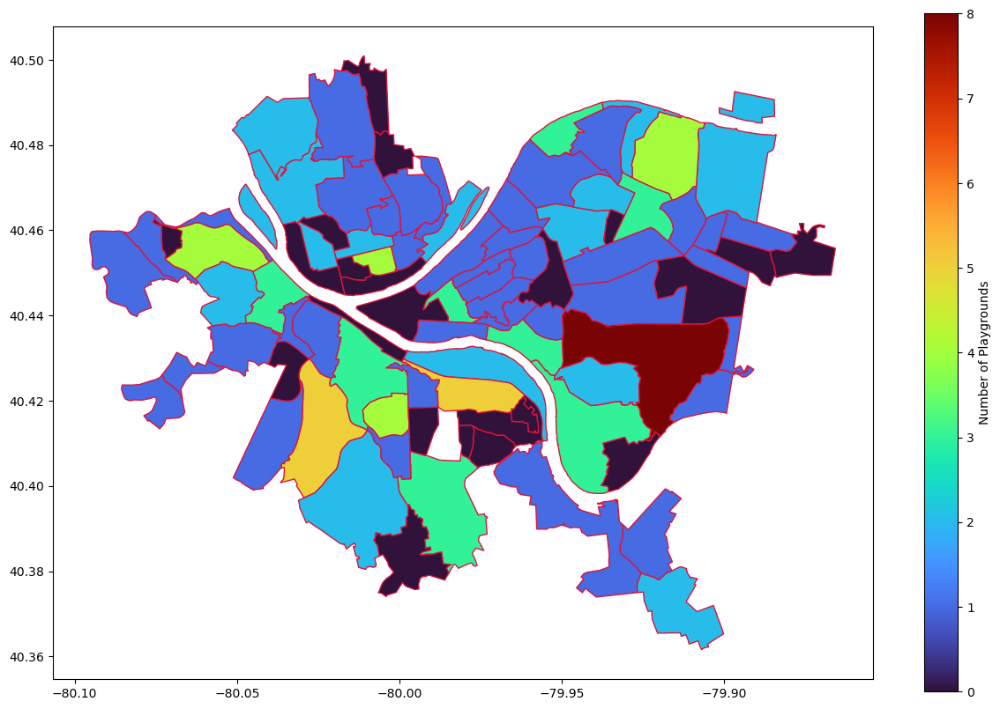

In [111]:
count_map.plot(column='count',
               cmap='turbo',              # choose a color palette
               edgecolor="crimson",        # outline the districts in white
               legend=True,              # show the legend
               legend_kwds={'label': "Number of Playgrounds"}, # label the legend
               figsize=(15, 10),         # set the size
               )
plt.show()

Looking at this chart, we can see that the nieborhood with most playgrounds is Squirrel Hill south, but there are many with no Playgrounds. 

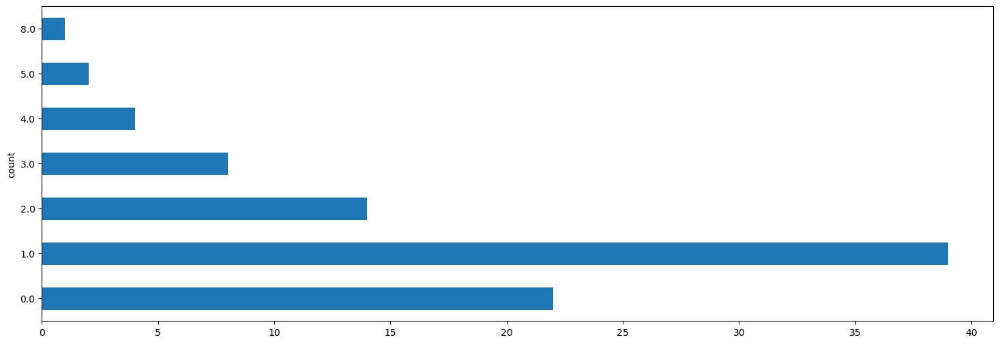

count
0.0    22
1.0    39
2.0    14
3.0     8
4.0     4
5.0     2
8.0     1
Name: count, dtype: int64

In [112]:
count_map["count"].value_counts().sort_index().plot(kind='barh', figsize= (18,6))
plt.show()
count_map["count"].value_counts().sort_index()


Looking at the data, there are 22 neiborhoods without playgrounds, thus using this data the number of viable canadates for most boring nieborhood and be narrowed down.

The narrowed list of those neighborhoods is below:

In [113]:
borings = count_map[count_map["count"] == 0]
borings["hood"]


1                 North Oakland
5     Central Business District
8                   Summer Hill
9             Northview Heights
20                   East Hills
33                 Point Breeze
44                  North Shore
48                   Friendship
49                    Arlington
50                    St. Clair
51                   Mt. Oliver
53                  South Shore
54               Allegheny West
57                    Knoxville
62                      Chateau
63            Arlington Heights
72                    Overbrook
73               Homewood South
84               Chartiers City
85                    Ridgemont
87         California-Kirkbride
88                   Glen Hazel
Name: hood, dtype: object